In [1]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

ST_PATH= "/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled.h5ad"
MSI_PATH= "/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi.h5ad"

st = ad.read_h5ad(ST_PATH)
msi = ad.read_h5ad(MSI_PATH)
gw_params = dict(verbose=True, inner_maxit=2000, outer_maxit = 2000, inner_tol=1e-8,   outer_tol=1e-8,   epsilon=1e-3)

In [2]:
import os, random, numpy as np, torch

def seed_everything(seed: int = 42):
    """Set global seed for reproducibility across common libraries."""
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)

    try:
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    except Exception:
        pass  # torch not installed or not used

    print(f"✅ Global seed set to {seed}")

GLOBAL_SEED = 42
seed_everything(GLOBAL_SEED)

✅ Global seed set to 42


In [3]:
import mgw.mgw as mgw
import scanpy as sc
from mgw import util
from mgw import gw

import importlib
importlib.reload(gw)
importlib.reload(mgw)
importlib.reload(util)

pre = mgw.mgw_preprocess(
    st, msi,
    PCA_comp=30,
    CCA_comp=3,
    use_cca_feeler=True,
    use_pca_X=True,
    use_pca_Z=True,
    log1p_X=True,
    log1p_Z=True,
    verbose=True,
)

/home/yx6674/.conda/envs/hm-ot/lib/python3.13/site-packages/scanpy/_utils/__init__.py:35: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/home/yx6674/.conda/envs/hm-ot/lib/python3.13/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/yx6674/.conda/envs/hm-ot/lib/python3.13/site-packages/scanpy/readwrite.py:15: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/yx6674/.conda/envs/hm-ot/lib/python3.13/site-packages/scanpy/preprocessing/_pca/__init__.py:245: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  Version(ad.__version__) < Version("0.9")
/home/yx6674/.conda/envs/hm-ot/lib/pyt

[mgw.pre] PCA/raw shapes: X=(34083, 30)  Z=(4269, 30)
[mgw.pre] CCA feeler: PCA → small GW (fused) → barycentric → CCA
Using precomputed PCA (30 comps).
Using precomputed PCA (30 comps).
Feature shapes -> X: (34083, 30) Z: (4269, 30)
Feeler GW sizes: X-side 8000, Z-side 4269
Solving feeler feature alignment.
Computing CCA Components
CCA dims: 3  (applied to full sets)


[mgw.core] device=cuda dtype=torch.float64
Using CCA
[mgw.core] dims: E=2, F_M=3, F_N=3
[mgw.core] loading cached φ, ψ


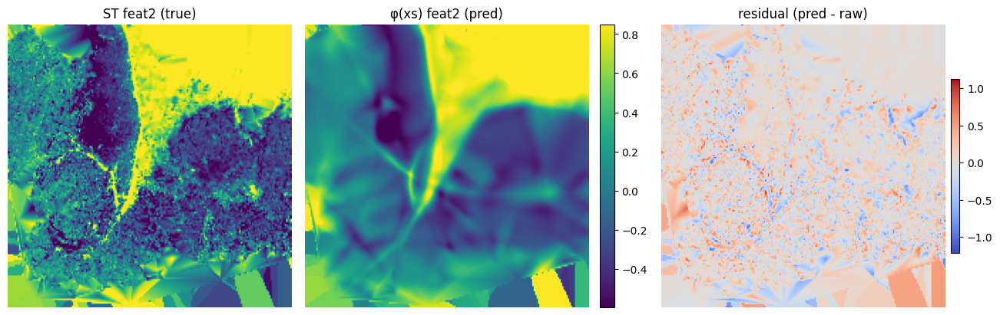

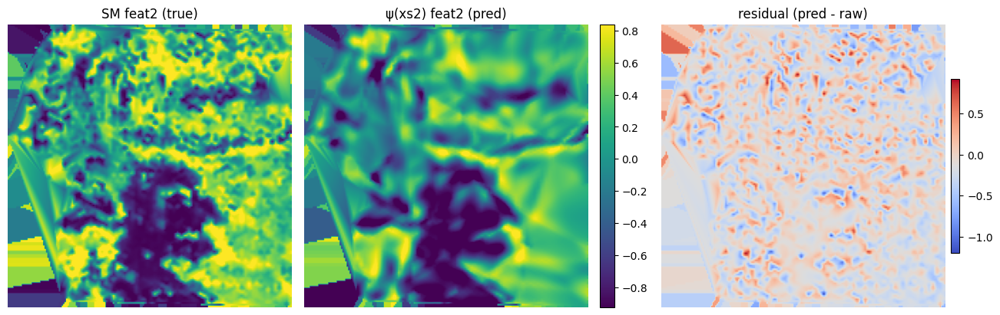

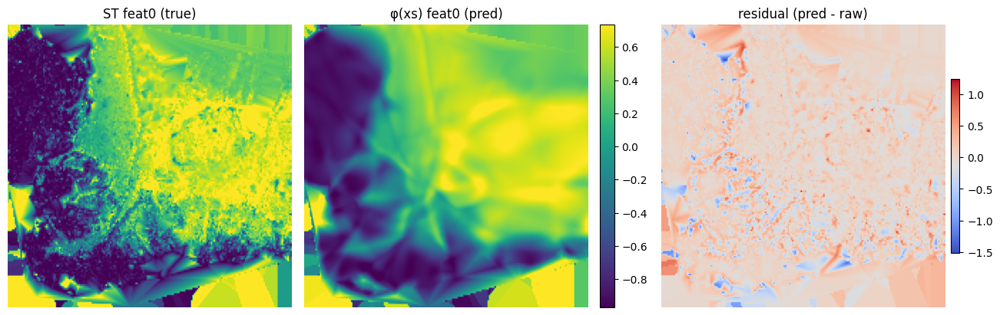

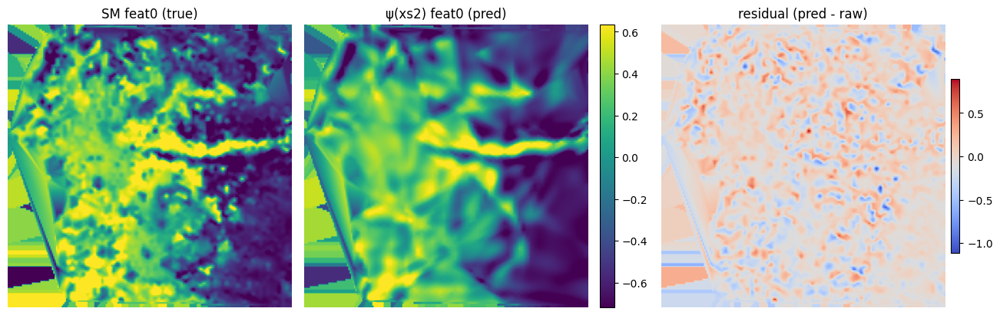

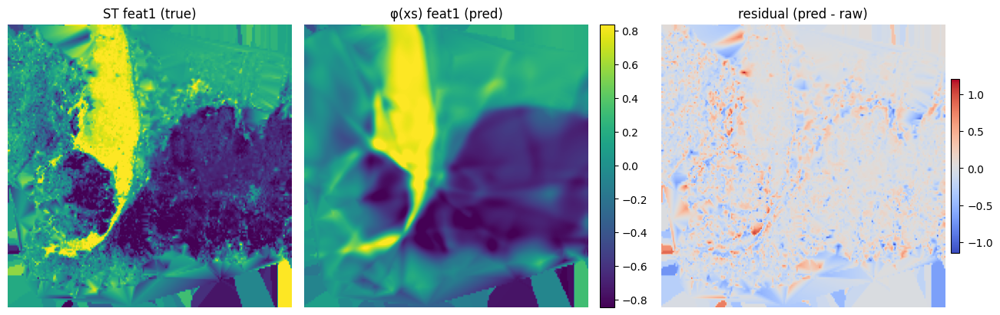

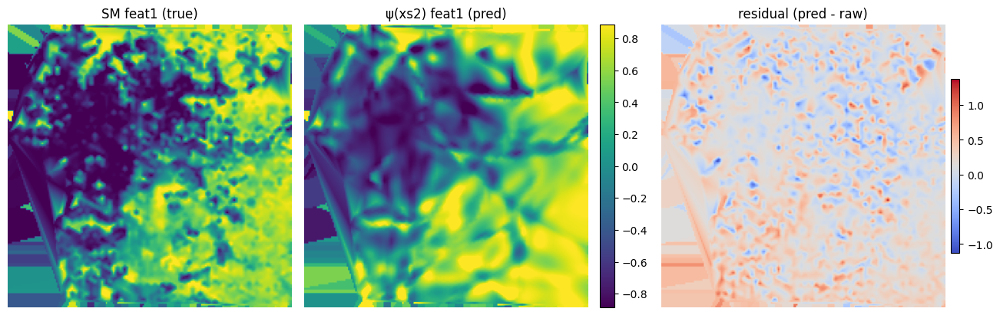

[mgw.core] pullback metrics & geodesics
Rescaling Jacobians by 58.950452868037644.
Rescaling Jacobians by 330.83066151137155.


/home/yx6674/ManifoldGW/mgw/mgw.py:193: RuntimeWarning: invalid value encountered in divide
  C_M = _norm_geod(D_M)**2; C_M /= (C_M.max() + 1e-12)


[mgw.core] solving GW with {'verbose': True, 'inner_maxit': 2000, 'outer_maxit': 2000, 'inner_tol': 1e-08, 'outer_tol': 1e-08, 'epsilon': 0.001}
[mgw.core] coupling: shape=(34083, 4269), mass=nan


(34083, 4269)

In [7]:
out = mgw.mgw_align_core(
    pre,
    widths=(128,256,256,128),
    lr=1e-3,
    niter=20_000,
    knn_k=12,
    geodesic_eps=1e-2, #1e-6
    save_dir="/scratch/gpfs/BRAPHAEL/xenium_visium/experiments",
    tag="Vis_Xen_crc_CCA_new",
    verbose=True,
    plot_net=True,
    gw_params = gw_params
)

P_vixe = out["P"]
P_vixe.shape

In [10]:
P_vixe

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(34083, 4269), dtype=float32)

In [5]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_vixe)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_vixe, alpha=0.005)

LinAlgError: SVD did not converge

/home/yx6674/.conda/envs/hm-ot/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


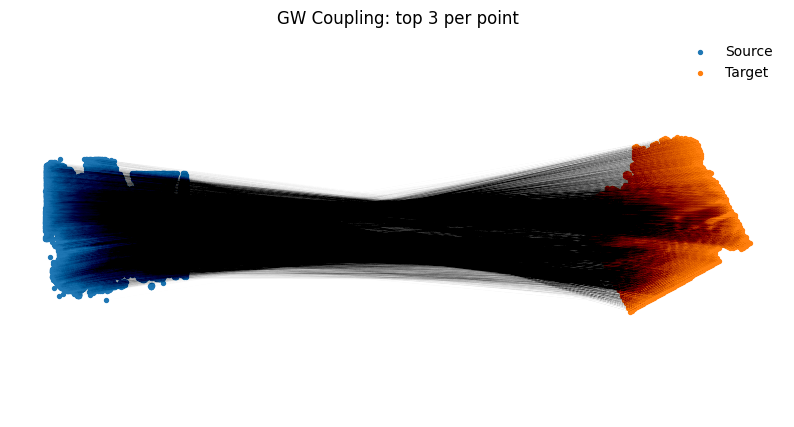

In [6]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_vixe)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_vixe, alpha=0.005)

[mgw.core] device=cuda dtype=torch.float64
Using PCA
[mgw.core] dims: E=2, F_M=8, F_N=8
[mgw.core] training φ, ψ
[train_phi] step=1000 loss=0.094940
[train_phi] step=2000 loss=0.083699
[train_phi] step=3000 loss=0.077234
[train_phi] step=4000 loss=0.074101
[train_phi] step=5000 loss=0.071978
[train_phi] step=6000 loss=0.070743
[train_phi] step=7000 loss=0.069129
[train_phi] step=8000 loss=0.067826
[train_phi] step=9000 loss=0.067054
[train_phi] step=10000 loss=0.065954
[train_phi] step=11000 loss=0.065154
[train_phi] step=12000 loss=0.066955
[train_phi] step=13000 loss=0.063775
[train_phi] step=14000 loss=0.071923
[train_phi] step=15000 loss=0.062843
[train_phi] step=16000 loss=0.062358
[train_phi] step=17000 loss=0.061971
[train_phi] step=18000 loss=0.061607
[train_phi] step=19000 loss=0.061712
[train_phi] step=20000 loss=0.060792
[train_phi] step=1000 loss=0.005124
[train_phi] step=2000 loss=0.003202
[train_phi] step=3000 loss=0.002224
[train_phi] step=4000 loss=0.001697
[train_phi] 

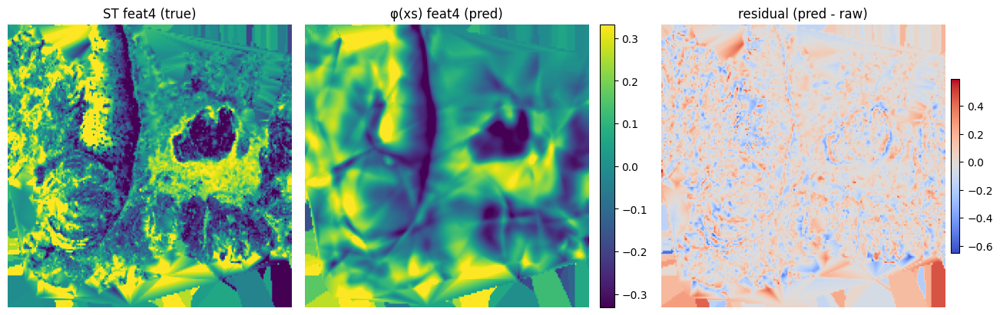

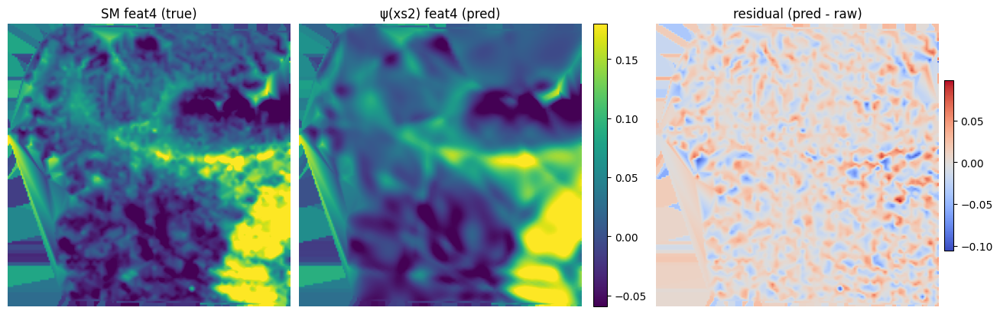

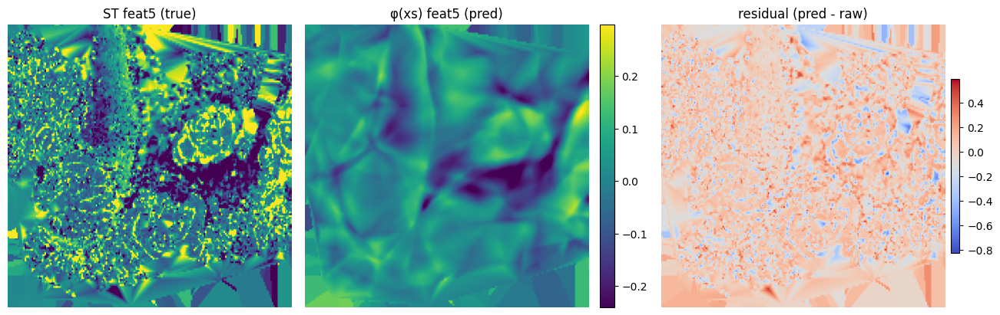

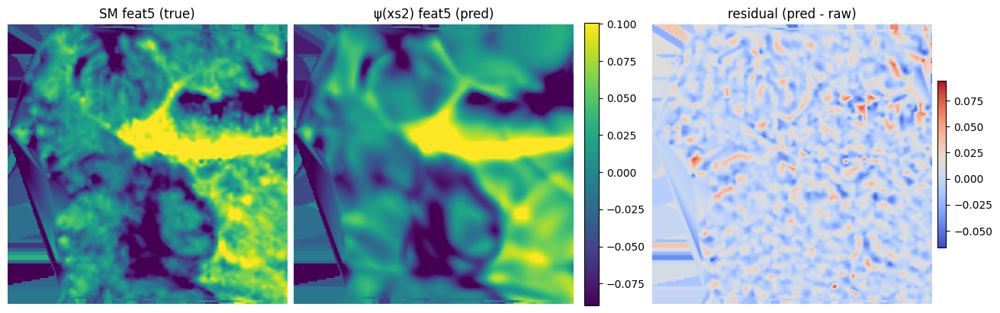

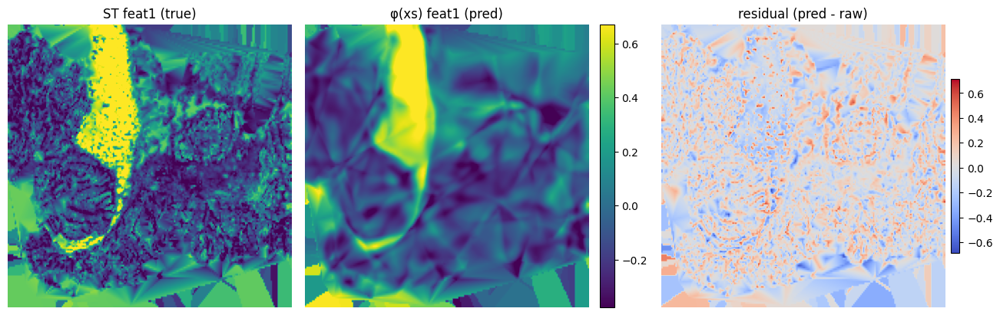

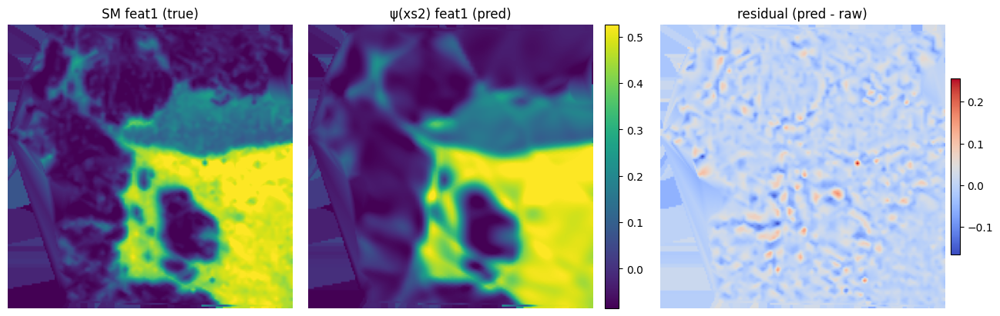

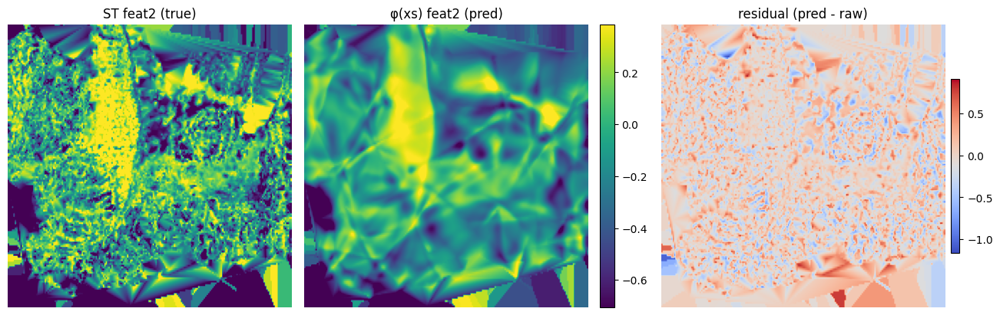

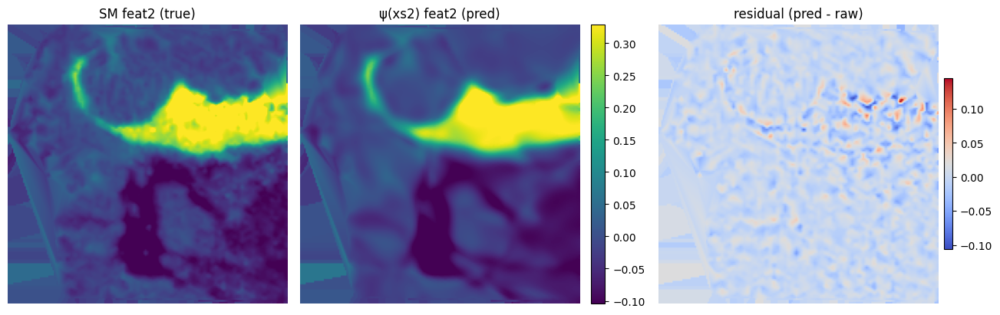

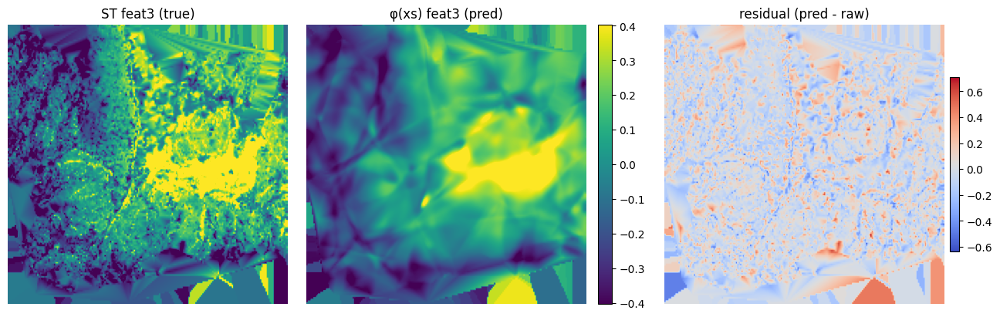

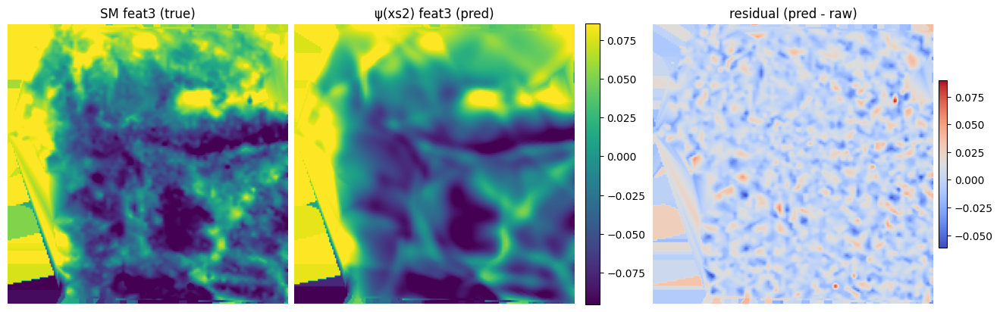

[mgw.core] pullback metrics & geodesics
Rescaling Jacobians by 322.14226907696315.
Rescaling Jacobians by 7.265072936873837.
[mgw.core] solving GW with {'verbose': True, 'inner_maxit': 3000, 'outer_maxit': 3000, 'inner_tol': 1e-06, 'outer_tol': 1e-06, 'epsilon': 0.0001}


W1031 10:36:41.785108   32748 gemm_fusion_autotuner.cc:1162] Slow kernel for %gemm_fusion_dot.11_computation (parameter_0.3: f32[34083,4269], parameter_1.3: f32[34083,34083]) -> f32[4269,34083] {
  %parameter_0.3 = f32[34083,4269]{1,0} parameter(0)
  %constant.668 = f32[] constant(10000), metadata={op_name="jit(<unnamed wrapped function>)/while/body/while/body/closed_call"}
  %broadcast.234 = f32[34083,4269]{1,0} broadcast(%constant.668), dimensions={}, metadata={op_name="jit(<unnamed wrapped function>)/while/body/while/body/closed_call/div" source_file="/home/yx6674/ManifoldGW/mgw/gw.py" source_line=131 source_end_line=131 source_column=10 source_end_column=18}
  %multiply.28 = f32[34083,4269]{1,0} multiply(%parameter_0.3, %broadcast.234), metadata={op_name="jit(<unnamed wrapped function>)/while/body/while/body/closed_call/div" source_file="/home/yx6674/ManifoldGW/mgw/gw.py" source_line=131 source_end_line=131 source_column=10 source_end_column=18}
  %exp.80 = f32[34083,4269]{1,0} exp

[mgw.core] coupling: shape=(34083, 4269), mass=1.000005


(34083, 4269)

In [4]:
out = mgw.mgw_align_core(
    pre,
    widths=(128,256,256,128),
    lr=1e-3,
    niter=20_000,
    knn_k=20,
    geodesic_eps=1e-2,
    save_dir="/scratch/gpfs/BRAPHAEL/xenium_visium/experiments",
    tag="Vis_Xen_crc_new_new",
    verbose=True,
    plot_net=True,
    gw_params = gw_params,
    use_cca=False
)

P_vixe = out["P"]
P_vixe.shape

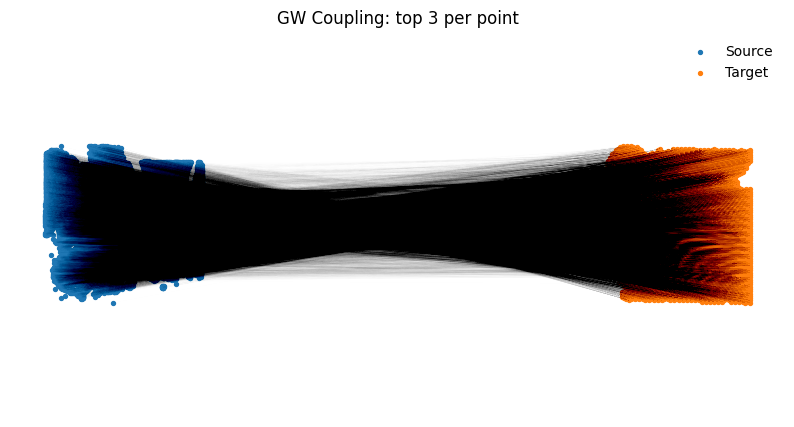

In [6]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

plotting.plot_alignment_lines_dense(xs, xs2, P_vixe, alpha=0.005)

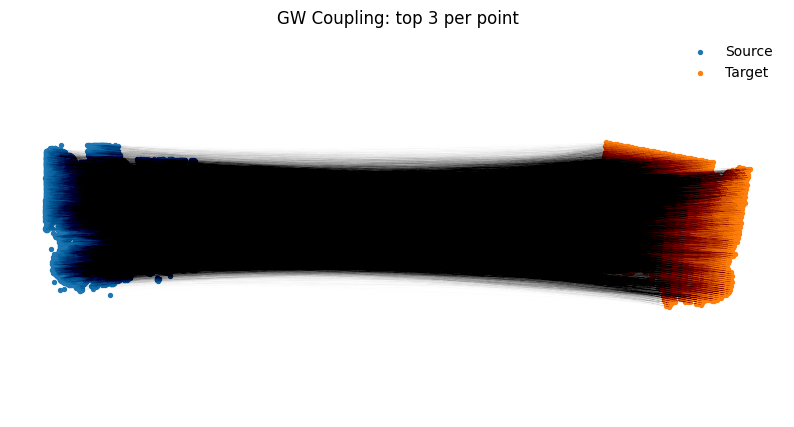

In [7]:
P_moscot= np.load('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_moscot_pca_crc.npy')
xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_moscot)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_moscot, alpha=0.005)

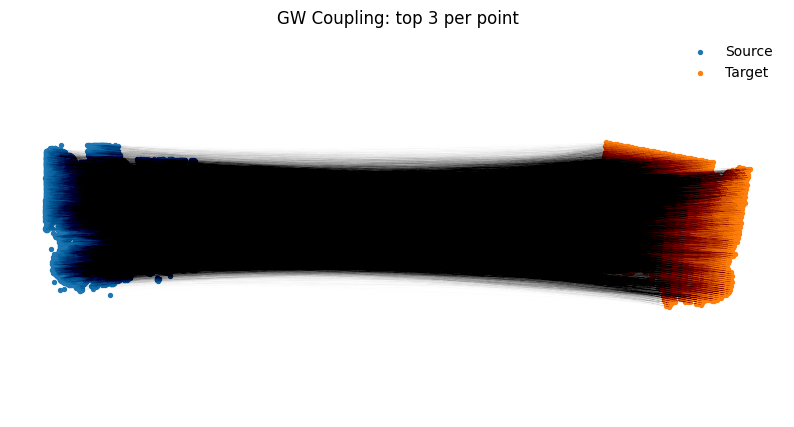

In [8]:
P_scot = np.load('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_scot_pca_crc.npy')
xs = out["xs"]
xs2 = out["xs2"]

xs_aligned, xt_aligned, R, tvec = plotting.procrustes_from_coupling(xs, xs2, P_moscot)
plotting.plot_alignment_lines_dense(xs_aligned, xt_aligned, P_moscot, alpha=0.005)

In [5]:
P_vixe

array([[1.07121751e-08, 3.69747699e-09, 6.61365496e-09, ...,
        9.06591868e-09, 6.72123956e-09, 7.49365281e-09],
       [4.50078819e-09, 1.20994201e-08, 2.33174702e-09, ...,
        2.97458969e-09, 1.08217764e-08, 1.00478141e-08],
       [4.99344832e-09, 1.13855343e-08, 2.40158360e-09, ...,
        3.21176197e-09, 1.08875522e-08, 1.02303268e-08],
       ...,
       [1.06307585e-08, 2.90442559e-09, 8.50875193e-09, ...,
        1.04940678e-08, 5.55988411e-09, 6.33826147e-09],
       [8.47983195e-09, 6.57253363e-09, 4.07256540e-09, ...,
        5.93446048e-09, 9.26253652e-09, 9.71257474e-09],
       [1.10540075e-08, 3.78269860e-09, 5.87637405e-09, ...,
        8.66704397e-09, 7.00812564e-09, 7.85077958e-09]],
      shape=(34083, 4269), dtype=float32)

In [7]:
np.save('P_manifoldgw_crc.npy', P_vixe)

In [8]:
from mgw.baselines import SpatialGW, SCOTGW
from moscot.problems.cross_modality import TranslationProblem

In [9]:
model = SpatialGW(gw_params = gw_params)
P_spatialgw = model.run(xs=pre["xs"],xs2=pre["xs2"])

model = SCOTGW(gw_params = gw_params)
P_scot_pca = model.run(Y=pre["X_feat"],Y2=pre["Z_feat"])

adata_st = st
adata_sm = msi
adata_st.obsm["X_pca"] = pre["X_feat"]
adata_sm.obsm["X_pca"] = pre["Z_feat"]
#adata_st.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_PCA.h5ad')
#adata_sm.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi_PCA.h5ad')

In [10]:
adata_st

AnnData object with n_obs × n_vars = 34083 × 422
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial', 'X_pca'

In [11]:
adata_sm

AnnData object with n_obs × n_vars = 4269 × 18085
    var: 'gene_ids', 'feature_types'
    uns: '_hires_sf', '_pixel_size', '_vi_bounding_box', '_vi_hires_src'
    obsm: 'spatial', 'X_pca'

In [12]:
adata_st.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-xe_downsampled_PCA.h5ad')
adata_sm.write_h5ad('/scratch/gpfs/BRAPHAEL/xenium_visium/crc-vi_PCA.h5ad')

In [13]:
tp = TranslationProblem(adata_src=adata_st, adata_tgt=adata_sm)
tp = tp.prepare(src_attr="X_pca", tgt_attr="X_pca")

tp = tp.solve(alpha=1.0, epsilon=1e-3,max_iterations=20_000,threshold=5e-4)

out = tp.solutions
ott_output = out[("src", "tgt")]
P_moscot_pca = ott_output.transport_matrix

INFO     Solving `1` problems                                                                                      
INFO     Solving problem OTProblem[stage='prepared', shape=(34083, 4269)].                                         


W1030 19:35:01.788626 2133819 gemm_fusion_autotuner.cc:1053] Compiling 140 configs for 7 fusions on a single thread.


WARNING  Solver did not converge                                                                                   


In [14]:
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_pca_mgw_crc.npy', P_vixe)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_spatialgw_crc.npy', P_spatialgw)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_scot_pca_crc.npy', P_scot_pca)
np.save('/scratch/gpfs/BRAPHAEL/xenium_visium/P_npy/P_moscot_pca_crc.npy', P_moscot_pca)